# ***CROP SEEKERS***

Dataset link: https://www.kaggle.com/datasets/suraj520/agricultural-data-for-rajasthan-india-2018-2019/data

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [ ]:
crop_production_df = pd.read_csv('crop_production_data.csv')
water_usage_df = pd.read_csv('water_usage_data.csv')
soil_analysis_df = pd.read_csv('soil_analysis_data.csv')
crop_price_df = pd.read_csv('crop_price_data.csv')

In [ ]:
crop_production_df.head()

,District,Crop,Season,Area (hectares),Yield (quintals),Production (metric tons)
0,Jodhpur,Wheat,Kharif,16490.142459,30.691986,5061.152230
1,Kota,Gram,Rabi,16943.065614,45.818232,7763.013072
2,Jaipur,Wheat,Rabi,14297.539876,29.752629,4253.893981
3,Hanumangarh,Coriander,Rabi,19737.638447,42.026511,8295.040749
4,Hanumangarh,Citrus,Rabi,13591.576842,38.195933,5191.429648


In [ ]:
water_usage_df.head()

,District,Crop,Irrigation Method,Water Consumption (liters/hectare),Water Availability (liters/hectare)
0,Udaipur,Garlic,Tube Well,11609.330886,11335.919980
1,Bhilwara,Gram,Drip Irrigation,12648.406038,12091.900254
2,Udaipur,Guava,Canal Irrigation,10063.162448,9810.943169
3,Jodhpur,Barley,Sprinkler Irrigation,10110.539993,10754.217313
4,Alwar,Gram,Canal Irrigation,9320.451018,8695.537819


In [ ]:
soil_analysis_df.head()

,District,Soil Type,pH Level,Organic Matter (%),Nitrogen Content (kg/ha),Phosphorus Content (kg/ha),Potassium Content (kg/ha)
0,Jaipur,Chalky (Calcareous),6.546096,1.569807,27.931972,29.438438,42.782766
1,Bhilwara,Nitrogenous,6.832259,2.243018,22.263480,25.413455,37.644377
2,Jodhpur,Sandy,7.453182,2.662898,23.564182,13.014409,37.082003
3,Jaipur,Clay,8.019189,1.240327,15.839222,17.744206,42.758704
4,Jaipur,Sandy,8.100131,1.768419,27.942867,25.769504,30.651292


In [ ]:
crop_price_df.head()

,District,Crop,Market,Date,Price (INR/quintal)
0,Alwar,Barley,Alwar APMC Mandi,2018-09-05,2490.092421
1,Sri Ganganagar,Pomegranate,Padampur Mandi,2018-11-20,2348.904922
2,Kota,Maize,Ramganj Mandi,2018-04-06,2448.287513
3,Nagaur,Fenugreek,Didwana Mandi,2018-09-26,2714.419518
4,Nagaur,Gram,Didwana Mandi,2018-10-06,2883.356997


In [ ]:
# Merging crop_production with water_usage
merged_df_1 = pd.merge(crop_production_df, water_usage_df, on=["District", "Crop"], how="inner")

# Merging the result of above with soil_analysis
merged_df_2 = pd.merge(merged_df_1, soil_analysis_df, on="District", how="inner")

# Merging the immediate above with crop_price
merged_final = pd.merge(merged_df_2, crop_price_df, on=["District", "Crop"], how="inner")

In [ ]:
merged_df = merged_final.sample(frac=0.005, random_state=42)

In [ ]:
merged_df.shape

(45276, 18)

In [ ]:
merged_df.head()

,District,Crop,Season,Area (hectares),Yield (quintals),Production (metric tons),Irrigation Method,Water Consumption (liters/hectare),Water Availability (liters/hectare),Soil Type,pH Level,Organic Matter (%),Nitrogen Content (kg/ha),Phosphorus Content (kg/ha),Potassium Content (kg/ha),Market,Date,Price (INR/quintal)
8778405,Ajmer,Fennel,Rabi,14597.948500,48.067853,7016.920362,Canal Irrigation,12349.410835,13170.188873,Clay,7.349767,1.497199,31.800821,17.311771,43.277019,Ajmer APMC Mandi,2019-01-02,1892.026667
2024649,Kota,Pomegranate,Kharif,19502.279372,45.850064,8941.807478,Drip Irrigation,7783.904317,8537.415012,Nitrogenous,7.162533,1.798462,39.957767,15.839693,37.249424,Kota APMC Mandi,2018-05-29,2944.849860
4890792,Udaipur,Oilseeds,Rabi,12282.803097,32.729985,4020.159598,Drip Irrigation,16822.457366,16805.754113,Black lava soil,7.733273,2.673113,32.611253,19.510424,51.362174,Udaipur APMC Mandi,2019-01-30,2163.659796
3096810,Hanumangarh,Barley,Kharif,13909.163363,47.454469,6600.519590,Tube Well,7845.401422,7476.235234,Saline,7.665057,1.592995,28.171615,22.521354,42.607247,Hanumangarh APMC Mandi,2019-01-03,2622.054291
4968612,Udaipur,Cumin,Rabi,15583.152905,41.082317,6401.920232,Sprinkler Irrigation,10142.648443,9881.992729,Loamy,7.571713,2.435762,23.744004,12.337409,47.897189,Fatehnagar Mandi,2019-04-07,2685.420548


In [ ]:
merged_df.dtypes

,0
District,object
Crop,object
Season,object
Area (hectares),float64
Yield (quintals),float64
Production (metric tons),float64
Irrigation Method,object
Water Consumption (liters/hectare),float64
Water Availability (liters/hectare),float64
Soil Type,object


In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 45276 entries, 8778405 to 2833973
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   District                             45276 non-null  object 
 1   Crop                                 45276 non-null  object 
 2   Season                               45276 non-null  object 
 3   Area (hectares)                      45276 non-null  float64
 4   Yield (quintals)                     45276 non-null  float64
 5   Production (metric tons)             45276 non-null  float64
 6   Irrigation Method                    45276 non-null  object 
 7   Water Consumption (liters/hectare)   45276 non-null  float64
 8   Water Availability (liters/hectare)  45276 non-null  float64
 9   Soil Type                            45276 non-null  object 
 10  pH Level                             45276 non-null  float64
 11  Organic Matter (%)       

In [ ]:
merged_df.describe()

,Area (hectares),Yield (quintals),Production (metric tons),Water Consumption (liters/hectare),Water Availability (liters/hectare),pH Level,Organic Matter (%),Nitrogen Content (kg/ha),Phosphorus Content (kg/ha),Potassium Content (kg/ha),Price (INR/quintal)
count,45276.000000,45276.000000,45276.000000,45276.000000,45276.000000,45276.000000,45276.000000,45276.000000,45276.000000,45276.000000,45276.000000
mean,15082.168372,37.643532,5677.711387,10511.873169,10491.529689,7.499319,1.994628,29.896344,19.742509,39.927374,2500.282456
std,2772.174836,8.261897,1632.982469,2844.288081,2923.862504,0.515034,0.516689,5.178696,5.053212,4.846280,296.790819
min,5276.197980,20.272936,1728.445956,4673.530139,4505.257189,5.889492,0.155817,11.994574,4.961838,24.116481,1323.279925
25%,13183.153381,31.012287,4491.574907,8172.130834,8109.718626,7.159913,1.635961,26.222506,16.262722,36.721561,2301.747641
50%,15180.690630,37.117412,5576.352032,10303.143064,10415.612501,7.506250,1.980037,29.899506,19.929505,39.830374,2501.839435
75%,16963.096969,43.968403,6747.797390,12711.245456,12914.887286,7.847932,2.354676,33.244410,23.098694,43.436192,2700.831511
max,20000.000000,60.429192,10834.530834,18631.091327,18489.171266,9.038430,3.764528,45.760284,35.588406,54.678290,3513.330472


In [ ]:
merged_df.duplicated().sum()

0

In [ ]:
# Check for missing values in each column
missing_values = merged_df.isnull().sum()
print(missing_values)

District                               0
Crop                                   0
Season                                 0
Area (hectares)                        0
Yield (quintals)                       0
Production (metric tons)               0
Irrigation Method                      0
Water Consumption (liters/hectare)     0
Water Availability (liters/hectare)    0
Soil Type                              0
pH Level                               0
Organic Matter (%)                     0
Nitrogen Content (kg/ha)               0
Phosphorus Content (kg/ha)             0
Potassium Content (kg/ha)              0
Market                                 0
Date                                   0
Price (INR/quintal)                    0
dtype: int64


In [ ]:
# Converting an object type representing a date to a datetime type so that we can perform arthematic operations on days,weeks,years and extract info about months,dates etc
merged_df['Date'] = pd.to_datetime(merged_df['Date'])
print(merged_df['Date'])

8778405   2019-01-02
2024649   2018-05-29
4890792   2019-01-30
3096810   2019-01-03
4968612   2019-04-07
             ...    
1796494   2018-10-14
5872836   2018-05-15
1601828   2019-03-24
6508988   2018-04-27
2833973   2018-07-29
Name: Date, Length: 45276, dtype: datetime64[ns]


In [ ]:
# verifying if Date column is of type DateTime
merged_df.dtypes

,0
District,object
Crop,object
Season,object
Area (hectares),float64
Yield (quintals),float64
Production (metric tons),float64
Irrigation Method,object
Water Consumption (liters/hectare),float64
Water Availability (liters/hectare),float64
Soil Type,object


In [ ]:
merged_df['Date'] = pd.to_datetime(merged_df['Date'])

# Extract features from Date column format yyyy-mm-dd
# merged_df['Year'] = merged_df['Date'].dt.year
# merged_df['Month'] = merged_df['Date'].dt.month
# merged_df['Day'] = merged_df['Date'].dt.day
merged_df['Day_of_Year'] = merged_df['Date'].dt.dayofyear

merged_df = merged_df.drop(columns=['Date'])

In [ ]:
print(merged_df.columns)

Index(['District', 'Crop', 'Season', 'Area (hectares)', 'Yield (quintals)',
       'Production (metric tons)', 'Irrigation Method',
       'Water Consumption (liters/hectare)',
       'Water Availability (liters/hectare)', 'Soil Type', 'pH Level',
       'Organic Matter (%)', 'Nitrogen Content (kg/ha)',
       'Phosphorus Content (kg/ha)', 'Potassium Content (kg/ha)', 'Market',
       'Price (INR/quintal)', 'Day_of_Year'],
      dtype='object')


In [ ]:
# standardising numerical values

from sklearn.preprocessing import MinMaxScaler

# Selecting the numerical columns
numerical_columns = [
    'Area (hectares)',
    'Yield (quintals)',
    'Production (metric tons)',
    'Water Consumption (liters/hectare)',
    'Water Availability (liters/hectare)',
    'pH Level',
    'Organic Matter (%)',
    'Nitrogen Content (kg/ha)',
    'Phosphorus Content (kg/ha)',
    'Potassium Content (kg/ha)',
    'Price (INR/quintal)',
    'Day_of_Year'
]

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Apply the scaler to the numerical columns
merged_df[numerical_columns] = scaler.fit_transform(merged_df[numerical_columns])


In [ ]:
merged_df.head()

,District,Crop,Season,Area (hectares),Yield (quintals),Production (metric tons),Irrigation Method,Water Consumption (liters/hectare),Water Availability (liters/hectare),Soil Type,pH Level,Organic Matter (%),Nitrogen Content (kg/ha),Phosphorus Content (kg/ha),Potassium Content (kg/ha),Market,Price (INR/quintal),Day_of_Year
8778405,Ajmer,Fennel,Rabi,0.633108,0.692169,0.580763,Canal Irrigation,0.549944,0.619636,Clay,0.463736,0.371707,0.586579,0.403242,0.626944,Ajmer APMC Mandi,0.259696,0.002747
2024649,Kota,Pomegranate,Kharif,0.966196,0.636940,0.792147,Drip Irrigation,0.222845,0.288343,Nitrogenous,0.404276,0.455189,0.828154,0.355177,0.429717,Kota APMC Mandi,0.740426,0.406593
4890792,Udaipur,Oilseeds,Rabi,0.475869,0.310214,0.251668,Drip Irrigation,0.870419,0.879618,Black lava soil,0.585525,0.697561,0.610580,0.475032,0.891495,Udaipur APMC Mandi,0.383726,0.079670
3096810,Hanumangarh,Barley,Kharif,0.586327,0.676894,0.535035,Tube Well,0.227251,0.212457,Saline,0.563861,0.398252,0.479097,0.573343,0.605029,Hanumangarh APMC Mandi,0.593034,0.005495
4968612,Udaipur,Cumin,Rabi,0.700020,0.518210,0.513225,Sprinkler Irrigation,0.391839,0.384494,Loamy,0.534219,0.631789,0.347969,0.240823,0.778118,Fatehnagar Mandi,0.621968,0.263736


In [ ]:
print(merged_df.columns)


Index(['District', 'Crop', 'Season', 'Area (hectares)', 'Yield (quintals)',
       'Production (metric tons)', 'Irrigation Method',
       'Water Consumption (liters/hectare)',
       'Water Availability (liters/hectare)', 'Soil Type', 'pH Level',
       'Organic Matter (%)', 'Nitrogen Content (kg/ha)',
       'Phosphorus Content (kg/ha)', 'Potassium Content (kg/ha)', 'Market',
       'Price (INR/quintal)', 'Day_of_Year'],
      dtype='object')


**The pandas-profiling library, named "ydata-profiling", is a Python library which is designed to automate the process of Exploratory Data Analysis (EDA). It generates a comprehensive and interactive report that provides a detailed overview of a dataset, making it easier to understand the data's structure, contents, and potential issues without writing extensive code.**

In [ ]:
!pip install ydata-profiling

In [ ]:
from ydata_profiling import ProfileReport

In [ ]:
profile = ProfileReport(merged_df, title="Merged DataFrame Profiling Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
print(merged_df['District'].unique())

['Ajmer' 'Kota' 'Udaipur' 'Hanumangarh' 'Jodhpur' 'Bhilwara' 'Nagaur'
 'Sri Ganganagar' 'Alwar' 'Jaipur']


In [ ]:
print(merged_df['Crop'].unique())

['Fennel' 'Pomegranate' 'Oilseeds' 'Barley' 'Cumin' 'Citrus' 'Mango'
 'Pulses' 'Bajra' 'Sugarcane' 'Chilli' 'Wheat' 'Coriander' 'Tomato'
 'Opium' 'Mustard' 'Guava' 'Fenugreek' 'Maize' 'Gram' 'Cotton' 'Garlic'
 'Onion']


In [ ]:
print(merged_df['Season'].unique())

['Rabi' 'Kharif']


In [ ]:
print(merged_df['Irrigation Method'].unique())

['Canal Irrigation' 'Drip Irrigation' 'Tube Well' 'Sprinkler Irrigation']


In [ ]:
print(merged_df['Soil Type'].unique())

['Clay' 'Nitrogenous' 'Black lava soil' 'Saline' 'Loamy' 'Sandy'
 'Chalky (Calcareous)' 'Alkaline']


In [ ]:
print(merged_df['Market'].unique())

['Ajmer APMC Mandi' 'Kota APMC Mandi' 'Udaipur APMC Mandi'
 'Hanumangarh APMC Mandi' 'Fatehnagar Mandi' 'Sojati Gate Mandi'
 'Bhilwara APMC Mandi' 'Kishangarh Mandi' 'Nagaur APMC Mandi'
 'Didwana Mandi' 'Padampur Mandi' 'Tijara Mandi' 'Alwar APMC Mandi'
 'Muhana Mandi' 'Jodhpur APMC Mandi' 'Kukas Mandi' 'Pilibanga Mandi'
 'Sri Ganganagar APMC Mandi' 'Mandal Mandi' 'Ramganj Mandi'
 'Chandpole Mandi' 'Kisan Mandi' 'Bassi Mandi' 'Sanganer Mandi']


In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

categorical_columns = ['District', 'Crop', 'Season', 'Irrigation Method', 'Soil Type', 'Market']

label_encoders = {}
mappings = {}

for col in categorical_columns:
    le = LabelEncoder()
    merged_df[col] = le.fit_transform(merged_df[col])
    label_encoders[col] = le
    mappings[col] = dict(zip(le.classes_, le.transform(le.classes_)))

for col, mapping in mappings.items():
    print(f"Mapping for {col}:")
    for category, encoded_value in mapping.items():
        print(f"  {category}: {encoded_value}")
    print()

Mapping for District:
  Ajmer: 0
  Alwar: 1
  Bhilwara: 2
  Hanumangarh: 3
  Jaipur: 4
  Jodhpur: 5
  Kota: 6
  Nagaur: 7
  Sri Ganganagar: 8
  Udaipur: 9

Mapping for Crop:
  Bajra: 0
  Barley: 1
  Chilli: 2
  Citrus: 3
  Coriander: 4
  Cotton: 5
  Cumin: 6
  Fennel: 7
  Fenugreek: 8
  Garlic: 9
  Gram: 10
  Guava: 11
  Maize: 12
  Mango: 13
  Mustard: 14
  Oilseeds: 15
  Onion: 16
  Opium: 17
  Pomegranate: 18
  Pulses: 19
  Sugarcane: 20
  Tomato: 21
  Wheat: 22

Mapping for Season:
  Kharif: 0
  Rabi: 1

Mapping for Irrigation Method:
  Canal Irrigation: 0
  Drip Irrigation: 1
  Sprinkler Irrigation: 2
  Tube Well: 3

Mapping for Soil Type:
  Alkaline: 0
  Black lava soil: 1
  Chalky (Calcareous): 2
  Clay: 3
  Loamy: 4
  Nitrogenous: 5
  Saline: 6
  Sandy: 7

Mapping for Market:
  Ajmer APMC Mandi: 0
  Alwar APMC Mandi: 1
  Bassi Mandi: 2
  Bhilwara APMC Mandi: 3
  Chandpole Mandi: 4
  Didwana Mandi: 5
  Fatehnagar Mandi: 6
  Hanumangarh APMC Mandi: 7
  Jodhpur APMC Mandi: 8
  Kis

In [ ]:
# check whether all categorical data is label encoded
print(merged_df['Market'].unique())
print(merged_df['Soil Type'].unique())
print(merged_df['Irrigation Method'].unique())
print(merged_df['Season'].unique())
print(merged_df['Crop'].unique())
print(merged_df['District'].unique())

[ 0 11 23  7  6 20  3 10 15  5 16 22  1 14  8 12 17 21 13 18  4  9  2 19]
[3 5 1 6 4 7 2 0]
[0 1 3 2]
[1 0]
[ 7 18 15  1  6  3 13 19  0 20  2 22  4 21 17 14 11  8 12 10  5  9 16]
[0 6 9 3 5 2 7 8 1 4]


In [ ]:
merged_df.shape

(45276, 18)

In [ ]:
print(merged_df.columns)

Index(['District', 'Crop', 'Season', 'Area (hectares)', 'Yield (quintals)',
       'Production (metric tons)', 'Irrigation Method',
       'Water Consumption (liters/hectare)',
       'Water Availability (liters/hectare)', 'Soil Type', 'pH Level',
       'Organic Matter (%)', 'Nitrogen Content (kg/ha)',
       'Phosphorus Content (kg/ha)', 'Potassium Content (kg/ha)', 'Market',
       'Price (INR/quintal)', 'Day_of_Year'],
      dtype='object')


# Spliting the Data into Training and Testing Sets (80:20)

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
# x is input
x = merged_df.drop(columns=['Price (INR/quintal)'])
# y is output
y = merged_df['Price (INR/quintal)']

In [ ]:
merged_df.shape

(45276, 18)

In [ ]:
# x_train and y_train are the training data
# x_test and y_test are the testing data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [ ]:
print("x_train shape is: ", x_train.shape)
print("y_train shape is: ",y_train.shape)
print("x_test shape is: ",x_test.shape)
print("y_test shape is: ",y_test.shape)

x_train shape is:  (36220, 17)
y_train shape is:  (36220,)
x_test shape is:  (9056, 17)
y_test shape is:  (9056,)




---


# Feature Selection with Random Forest



In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
# Initialize the RandomForestRegressor model
model = RandomForestRegressor(random_state=42)

In [ ]:
# Fit the model to the training data
model.fit(x_train, y_train)

RandomForestRegressor(random_state=42)

In [ ]:
# Get feature importances from the trained model
importances = model.feature_importances_

In [ ]:
# Create a DataFrame to display the features and their importance scores
feature_importances = pd.DataFrame({'Feature': x_train.columns, 'Importance': importances})

In [ ]:
# Sort the features by their importance score in descending order
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

In [ ]:
# Set a threshold for feature importance
threshold = 0.05  # Example threshold, you can adjust this value

In [ ]:
# Select features with importance above the threshold
selected_features = feature_importances[feature_importances['Importance'] > threshold]['Feature']

In [ ]:
print(f"Selected features with importance above {threshold}:")
print(selected_features)

Selected features with importance above 0.05:
16    Day_of_Year
1            Crop
15         Market
0        District
Name: Feature, dtype: object


In [ ]:
# Select only the features that meet the threshold from the training and testing datasets
x_train_selected = x_train[selected_features]
x_test_selected = x_test[selected_features]

# ***Applying Models***

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

# 1.  XGBoost Regressor

In [ ]:
from xgboost import XGBRegressor

In [ ]:
param_grid = {
    'n_estimators': [1500, 1700],  # Number of trees
    'learning_rate': [0.01, 0.02],  # Lower learning rate for more precise boosting
    'max_depth': [12,13]  # Deeper trees to capture more complex patterns
}

In [ ]:
# Initialize the XGBRegressor
model = XGBRegressor(random_state=42)

In [ ]:
# Initialize GridSearchCV with the model and parameter grid
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2, scoring='r2')

In [ ]:
# Fit the GridSearchCV to the training data
grid_search.fit(x_train_selected, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


GridSearchCV(cv=3,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_cat_threshold=None,
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=42, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.02], 'max_depth': [12, 13],
                         'n_estimators': [1500, 1700]},
             scoring='r2', verbose=2)

In [ ]:
# Using the best model to make predictions on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(x_test_selected)

# Evaluating the model performance on the test set
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Test Set Mean Squared Error: {mse}")
print(f"Test Set R-squared: {r2}")

Test Set Mean Squared Error: 0.00036237771645220224
Test Set R-squared: 0.9799408909746998


# 2. Light Gradient Boosting Machine Regressor

In [ ]:
import lightgbm as lgb

In [ ]:
# Define the parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [1000, 1500],  # Number of boosting iterations
    'learning_rate': [0.01, 0.05],  # Learning rate
    'max_depth': [10, 15],  # Maximum depth of trees
    'num_leaves': [50, 100],  # Number of leaves in one tree
}

In [ ]:
# Initialize the LightGBM Regressor
model = lgb.LGBMRegressor(random_state=42)

In [ ]:
# Initialize GridSearchCV with the model and parameter grid
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2, scoring='r2')

In [ ]:
# fitting model
grid_search.fit(x_train_selected, y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 299
[LightGBM] [Info] Number of data points in the train set: 36220, number of used features: 4
[LightGBM] [Info] Start training from score 0.537551
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


GridSearchCV(cv=3, estimator=LGBMRegressor(random_state=42), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05], 'max_depth': [10, 15],
                         'n_estimators': [1000, 1500],
                         'num_leaves': [50, 100]},
             scoring='r2', verbose=2)

In [ ]:
# Using the best model to make predictions on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(x_test_selected)

# Evaluating the model performance on the test set
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Test Set Mean Squared Error: {mse}")
print(f"Test Set R-squared: {r2}")

Test Set Mean Squared Error: 0.000945203898503649
Test Set R-squared: 0.9476790453981344


# 3. Random Forest Regressor





In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
param_grid = {
    'n_estimators': [800,1200],  # Number of trees in the forest
    'max_depth': [None],  # Allow trees to grow deep enough to capture patterns
    'max_features': ['sqrt', 'log2']  # Consider a subset of features at each split
}

In [ ]:
# Initializing RandomForestRegressor
model = RandomForestRegressor(random_state=42, n_jobs=-1)

In [ ]:
# Initializing GridSearchCV with the parameter grid
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2, scoring='r2')

In [ ]:
# Fitting GridSearchCV to the training data
grid_search.fit(x_train_selected, y_train)

Fitting 3 folds for each of 4 candidates, totalling 12 fits


GridSearchCV(cv=3, estimator=RandomForestRegressor(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [None], 'max_features': ['sqrt', 'log2'],
                         'n_estimators': [800, 1200]},
             scoring='r2', verbose=2)

In [ ]:
# print("Best Hyperparameters:", grid_search.best_params_)
# print("Best Cross-Validation R2 Score:", grid_search.best_score_)

In [ ]:
# Using the best model to make predictions on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(x_test_selected)

# Evaluating the model performance on the test set
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Test Set Mean Squared Error: {mse}")
print(f"Test Set R-squared: {r2}")

Test Set Mean Squared Error: 0.0003566338324606522
Test Set R-squared: 0.9802588387678015


# 4. Gradient Boosting Regressor


In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

In [ ]:
# Define the parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [900, 1000],  # Number of trees
    'learning_rate': [0.01, 0.02],  # Learning rate
    'max_depth': [15, 20]  # Depth of each tree
}

In [ ]:
# Initialize the GradientBoostingRegressor
model = GradientBoostingRegressor(random_state=42)

In [ ]:
# Initialize GridSearchCV with the model and parameter grid
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=3, scoring='r2')


In [ ]:
# Fit the GridSearchCV to the training data
grid_search.fit(x_train_selected, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


GridSearchCV(cv=3, estimator=GradientBoostingRegressor(random_state=42),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.02], 'max_depth': [15, 20],
                         'n_estimators': [900, 1000]},
             scoring='r2', verbose=3)

In [ ]:
# Using the best model to make predictions on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(x_test_selected)

# Evaluating the model performance on the test set
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Test Set Mean Squared Error: {mse}")
print(f"Test Set R-squared: {r2}")

Test Set Mean Squared Error: 0.0002813625256112793
Test Set R-squared: 0.9844254176770969


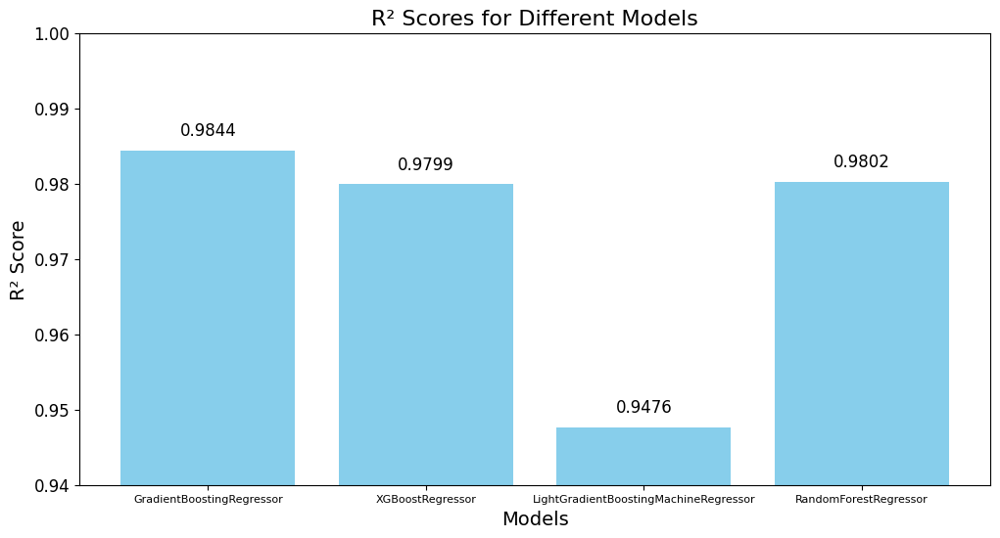

In [ ]:
models = ['GradientBoostingRegressor', 'XGBoostRegressor', 'LightGradientBoostingMachineRegressor', 'RandomForestRegressor']
r2_scores = [0.9844, 0.9799, 0.9476, 0.9802]  # R² scores
mse_values = [0.028, 0.036, 0.094, 0.035]  # MSE values

# Plotting R² Scores
plt.figure(figsize=(12, 6))
bars = plt.bar(models, r2_scores, color='skyblue')
plt.title('R² Scores for Different Models', fontsize=16)
plt.xlabel('Models', fontsize=14)
plt.ylabel('R² Score', fontsize=14)
plt.ylim(0.94, 1)  # Adjusted y-axis limit to focus on high accuracy values

# Keep the x-tick labels horizontal
plt.xticks(fontsize=8, rotation=0, ha='center')
plt.yticks(fontsize=12)

# Adding the value on top of the bars with four decimal places
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.002, f"{yval:.4f}", ha='center', fontsize=12)

plt.show()


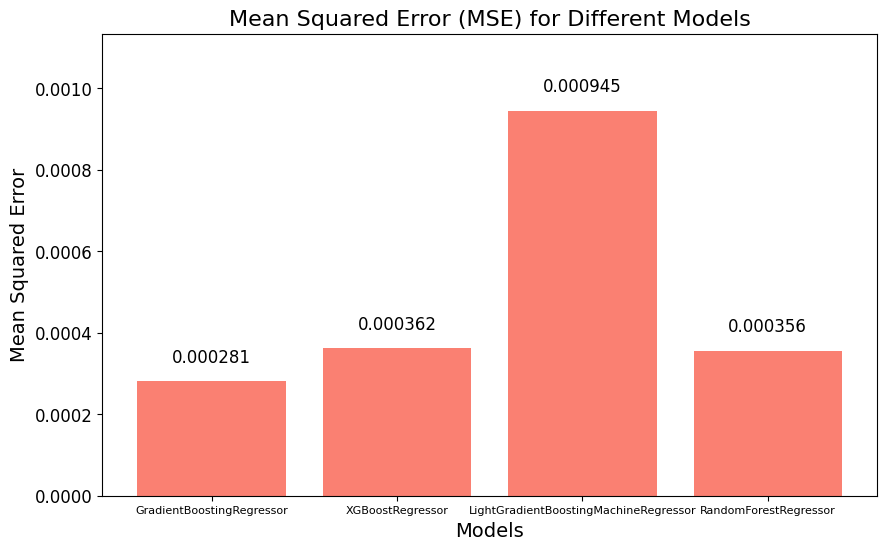

In [ ]:
models = ['GradientBoostingRegressor', 'XGBoostRegressor', 'LightGradientBoostingMachineRegressor', 'RandomForestRegressor']
mse_values = [0.000281, 0.000362, 0.000945, 0.000356]  # MSE values

# Plotting Mean Squared Error (MSE)
plt.figure(figsize=(10, 6))
bars = plt.bar(models, mse_values, color='salmon')
plt.title('Mean Squared Error (MSE) for Different Models', fontsize=16)
plt.xlabel('Models', fontsize=14)
plt.ylabel('Mean Squared Error', fontsize=14)
plt.xticks(fontsize=8)
plt.yticks(fontsize=12)

# Extend the y-axis limit to provide more space above the bars
plt.ylim(0, max(mse_values) + max(mse_values) * 0.2)

# Adding the value on top of the bars with proper positioning and precision
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + max(mse_values) * 0.05, f"{yval:.6f}", ha='center', fontsize=12)

plt.show()
